##layers.Conv2D

In [1]:
import tensorflow as tf
# The inputs are 28x28 RGB images with `channels_last` and the batch
# size is 4.
input_shape = (4, 28, 28, 3)      # (batch, height, width, color channel)
x = tf.random.normal(input_shape)
y = tf.keras.layers.Conv2D(filters=2, kernel_size=3, input_shape=input_shape)(x)
x.shape, y.shape, #x, y


(TensorShape([4, 28, 28, 3]), TensorShape([4, 26, 26, 2]))

In [2]:
y.ndim, y.dtype

(4, tf.float32)

In [3]:
# With `padding` as "same".
input_shape = (4, 28, 28, 3)
x = tf.random.normal(input_shape)
y = tf.keras.layers.Conv2D(filters=5, kernel_size=(3,3), padding="same", activation='relu', input_shape=input_shape)(x)
print(y.shape)


(4, 28, 28, 5)


##layers.AveragePooling2D

In [4]:
x = [[1., 2., 3., 4.],
                 [5., 6., 7., 8.],
                 [9., 10., 11., 12.]]
x = tf.reshape(x, [1, 3, 4, 1])
max_pool_2d = tf.keras.layers.AveragePooling2D(pool_size=(2, 2),
   strides=(1, 1), padding='valid')
max_pool_2d(x)

<tf.Tensor: shape=(1, 2, 3, 1), dtype=float32, numpy=
array([[[[3.5],
         [4.5],
         [5.5]],

        [[7.5],
         [8.5],
         [9.5]]]], dtype=float32)>

##layers.MaxPool2D

In [5]:
x = tf.constant([[1., 2., 3., 4.],
                 [5., 6., 7., 8.],
                 [9., 10., 11., 12.]])
x = tf.reshape(x, [1, 3, 4, 1])
max_pool_2d = tf.keras.layers.MaxPooling2D(pool_size=(2, 2),
   strides=(1, 1), padding='valid')
max_pool_2d(x)

<tf.Tensor: shape=(1, 2, 3, 1), dtype=float32, numpy=
array([[[[ 6.],
         [ 7.],
         [ 8.]],

        [[10.],
         [11.],
         [12.]]]], dtype=float32)>

In [6]:
x = tf.constant([[1., 2., 3.],
                 [4., 5., 6.],
                 [7., 8., 9.]])
x = tf.reshape(x, [1, 3, 3, 1])
max_pool_2d = tf.keras.layers.MaxPooling2D(pool_size=(2, 2),
   strides=(1, 1), padding='same')
max_pool_2d(x)

<tf.Tensor: shape=(1, 3, 3, 1), dtype=float32, numpy=
array([[[[5.],
         [6.],
         [6.]],

        [[8.],
         [9.],
         [9.]],

        [[8.],
         [9.],
         [9.]]]], dtype=float32)>

##ImageDataGenerator()

In [7]:
import tensorflow as tf
_URL = 'https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip'

path_to_zip = tf.keras.utils.get_file('cats_and_dogs.zip', origin=_URL, extract=True, cache_dir='./')

68608000/68606236 [==============================] - 10s 0us/step


In [8]:
path_to_zip

'./datasets/cats_and_dogs.zip'

###flow_from_directory(directory)

In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.6,
        zoom_range=0.6,
        rotation_range=90,
        horizontal_flip=True,
        vertical_flip=True)
train_generator = train_datagen.flow_from_directory(
        './datasets/cats_and_dogs_filtered/train',
        # './testdatasets',
        target_size=(150, 150),
        batch_size=32,
        # class_mode='binary'
        )

Found 2000 images belonging to 2 classes.


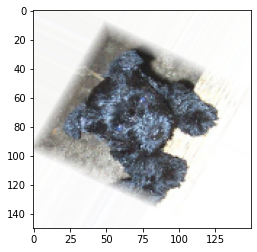

In [10]:
x,y = train_generator.next()    # get batch_size by next()

import matplotlib.pyplot as plt
image = x[0]
plt.imshow(image)
# plt.show()

In [11]:
x.shape, y.shape, len(y)

((32, 150, 150, 3), (32, 2), 32)

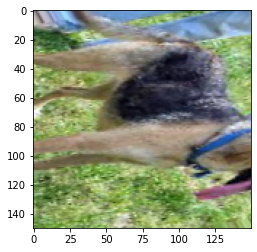

In [12]:
import matplotlib.pyplot as plt
image = x[3]
plt.imshow(image)
plt.show()

### save file with generator

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.6,
        zoom_range=[0.1, 0.6],
        rotation_range=50,
        horizontal_flip=True,
        vertical_flip=True)

train_generator = train_datagen.flow_from_directory(
        './source',
        target_size=(150, 150),
        batch_size=3, classes=['cats'],
        # class_mode='binary', shuffle=False, 
        save_to_dir='./target/cats', save_prefix='tmp', save_format='jpg'
        )

Found 0 images belonging to 1 classes.


In [14]:
train_generator.next()

(array([], shape=(0, 150, 150, 3), dtype=float32),
 array([], shape=(0, 1), dtype=float32))

In [15]:
for i in range(5):
  train_generator.next()

In [16]:
# len(train_generator)
gen = train_generator
print(gen, end=', ')


In [ ]:
i = 0
while 1:
  gen = train_generator.next()
  print(gen, end=', ')
  # train_generator.next()

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

, (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dty

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype

(array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype=float32)), (array([], shape=(0, 150, 150, 3), dtype=float32), array([], shape=(0, 1), dtype